In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
from scipy.linalg import inv

In [2]:
def Phi(x, M):
    return x[:,None] ** np.tile(np.arange(M), (len(x), 1))    

def linear(x, w0, w1):
    return w0 + w1*x

def gaussian(x, mu, beta):
    return np.sqrt(beta/(2*np.pi)) * np.exp(-beta/2 * (x-mu)**2)

def likelihood_2D(w0, w1, x, y, beta):
    return gaussian(y, linear(x, w0, w1), beta)

def posterior_2D(w0, w1, mn, Sn):
    return multivariate_normal.pdf(np.dstack([w0, w1]), mn, Sn)

def posterior_sample(mn, Sn, size=1):
    return multivariate_normal.rvs(mn, Sn, size)

In [3]:
w_true = [-0.3, 0.5]
M = 2
N = 200

alpha = 2
beta = 25

x_true = np.linspace(-1, 1, N)
y_true = linear(x_true, *w_true)

np.random.seed(2018)
x = np.random.uniform(-1, 1, N)
y = linear(x, *w_true) + np.random.normal(0, np.sqrt(1/beta), N)

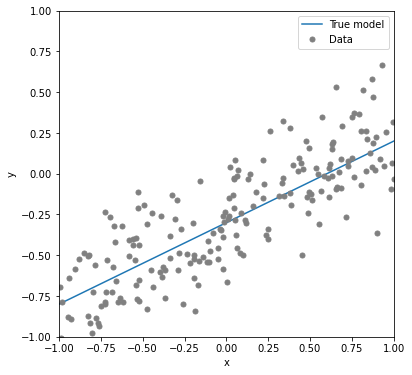

In [4]:
fig = plt.figure(figsize=(6, 6))

plt.plot(x_true, y_true, label='True model')
plt.plot(x, y, '.', c='gray', ms=10, label='Data')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.xlabel('x')
plt.ylabel('y')
plt.legend()

In [5]:
m0 = np.zeros(M)
S0 = alpha**-1 * np.identity(M)
w0, w1 = np.mgrid[-1:1:0.01, -1:1:0.01]

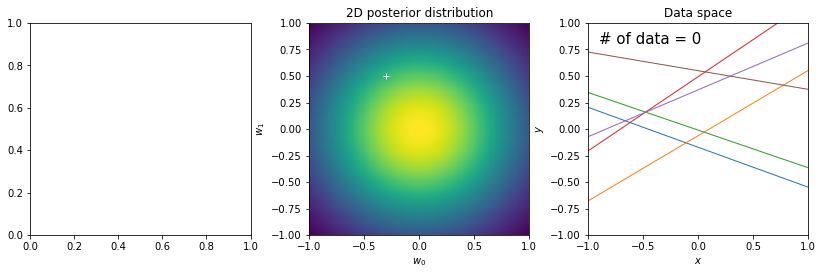

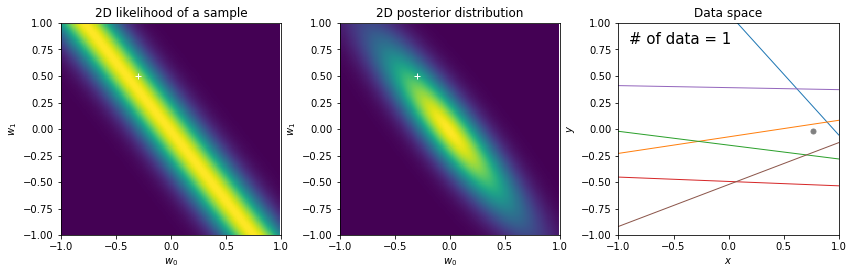

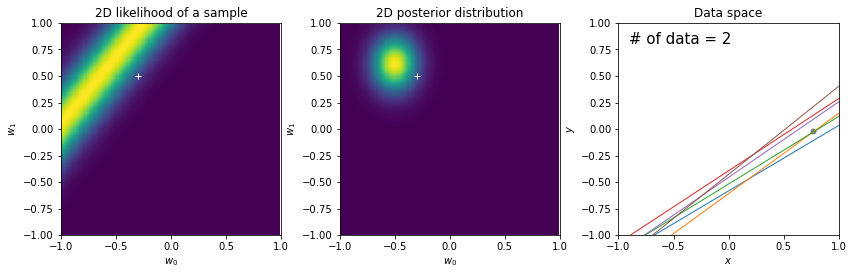

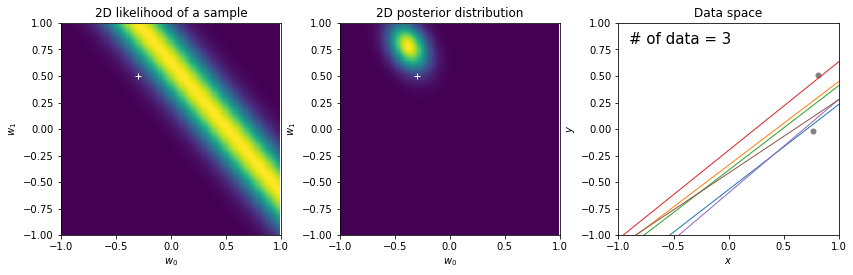

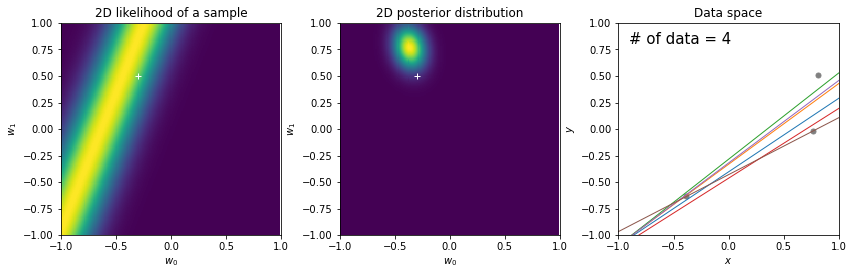

...

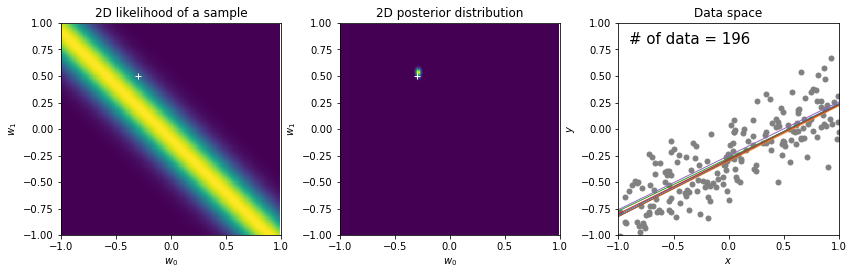

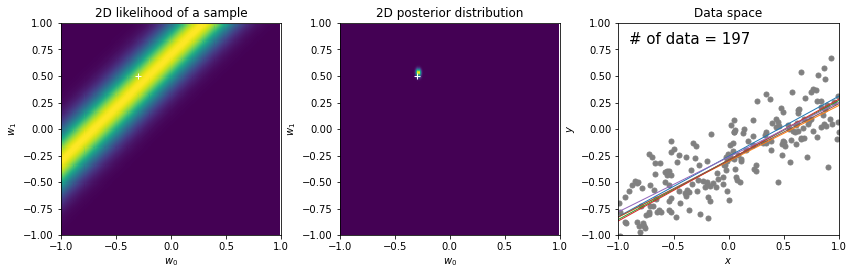

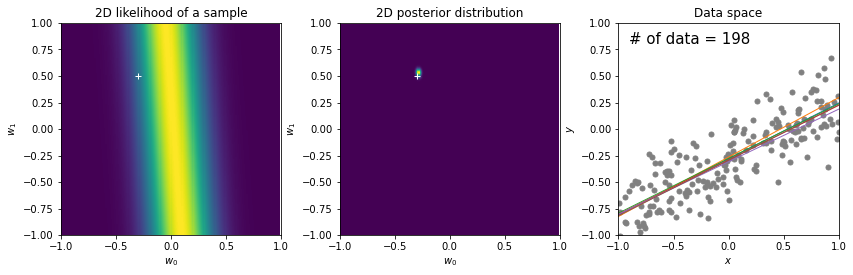

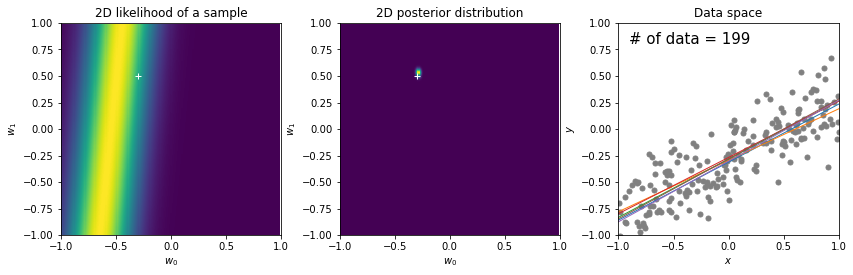

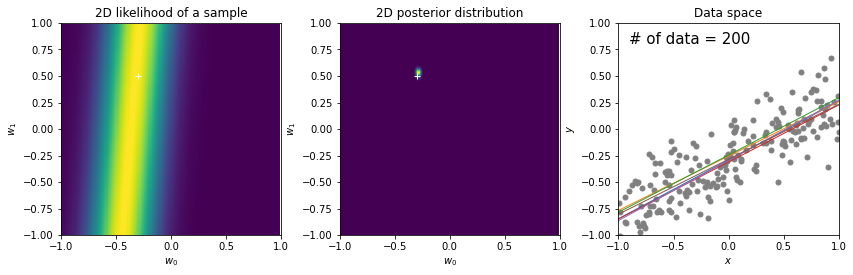

In [6]:
for n in range(0, N+1):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    fig.tight_layout(pad=2.75)
    Phin = Phi(x[:n], M)
    Sn = inv(inv(S0) + beta * Phin.T@Phin)
    mn = Sn @ (inv(S0)@m0 + beta * Phin.T@y[:n])
    
    ax = axes[2]
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_title('Data space')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$')
    im2 = []
    im2 += ax.plot(x[:n], y[:n], '.', c='gray', ms=10)
    im2+=[ax.text(-0.9, 0.8, f'# of data = {n}', fontsize=15)]
    for i in range(6):
        w_sampled = posterior_sample(mn, Sn)
        im2 += ax.plot(x_true, linear(x_true, *w_sampled), lw=1)
    
    ax = axes[1]
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_title('2D posterior distribution')
    ax.set_xlabel('$w_{0}$')
    ax.set_ylabel('$w_{1}$')
    im1 = []
    im1 += [ax.pcolormesh(w0, w1, posterior_2D(w0, w1, mn, Sn))]
    im1 += [ax.scatter(*w_true, marker='+', c='white', lw=1)]
    
    if n==0:
        plt.show()
    
    ax = axes[0]
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_title(f'2D likelihood of a sample')
    ax.set_xlabel('$w_{0}$')
    ax.set_ylabel('$w_{1}$')
    im0 = []
    im0 += [ax.pcolormesh(w0, w1, likelihood_2D(w0, w1, x[n-1], y[n-1], beta))]
    im0 += [ax.scatter(*w_true, marker='+', c='white', lw=1)]
    
    plt.show()